In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mplt
import seaborn as sns
import arviz as az
import datetime

In [2]:
import fit_arima

In [3]:
import open_data
df = open_data.open()

In [4]:
ritorno = fit_arima.compute(2, 1, catene=4, samples_per_chain=1250, burnin=1000)

17:17:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

17:35:25 - cmdstanpy - INFO - CmdStan done processing.
17:35:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Scale parameter is 0, but must be positive! (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/NoCovariates/code.stan', line 157, column 4 to column 34)
	Exception: normal_lpdf: Scale parameter is 0, but must be positive! (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/NoCovariates/code.stan', line 157, column 4 to column 34)
	Exception: normal_lpdf: Scale parameter is 0, but must be positive! (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/NoCovariates/code.stan', line 157, column 4 to column 34)
	Exception: code_model_namespace::log_prob: phi[1][3] is -nan, but must be greater than or equal to -1.000000 (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/NoCovariates/code.stan', line 83, column 2 to column 47)
Exception: normal_lpdf: Scale parameter is -0.687949, but must b

/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/NoCovariates/fit_arima.py:37: FutureWarning: Indexing with a float is deprecated, and will raise an IndexError in pandas 2.0. You can manually convert to an integer key instead.
  y_missing_list.append({'Stazione':df.columns[v[i]],'Data':df.index[u[i]],'Samples':inference_data.posterior.w.values[:,:,i].reshape(catene*samples_per_chain)})


Tempo di computazione: 18:23

In [5]:
res = az.loo(ritorno['inference_data'], var_name="log_lik", pointwise=True)
res

/home/br1/PythonProjects/PythonStats/.venv/lib/python3.10/site-packages/arviz/stats/stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Computed from 5000 posterior samples and 17148 observations log-likelihood matrix.

         Estimate       SE
elpd_loo  7287.64   154.66
p_loo      313.24        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     17017   99.2%
 (0.5, 0.7]   (ok)         110    0.6%
   (0.7, 1]   (bad)         19    0.1%
   (1, Inf)   (very bad)     2    0.0%

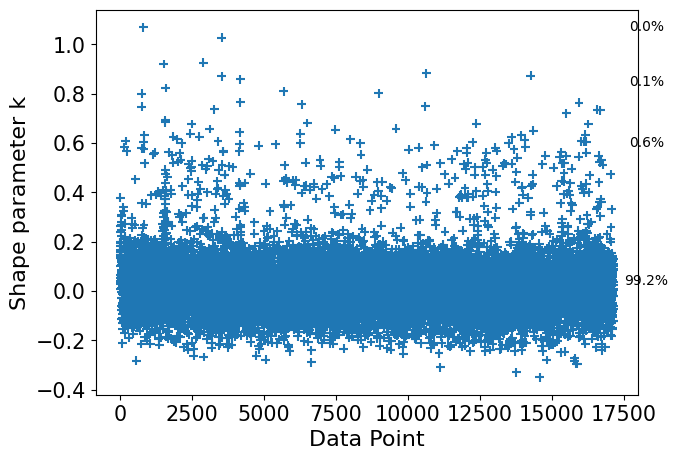

In [6]:
aux_plt = az.plot_khat(res, show_bins=True, figsize=(7,5))

In [7]:
res = az.waic(ritorno['inference_data'], var_name="log_lik")
res

/home/br1/PythonProjects/PythonStats/.venv/lib/python3.10/site-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 5000 posterior samples and 17148 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  7301.79   154.50
p_waic      299.09        -

There has been a warning during the calculation. Please check the results.

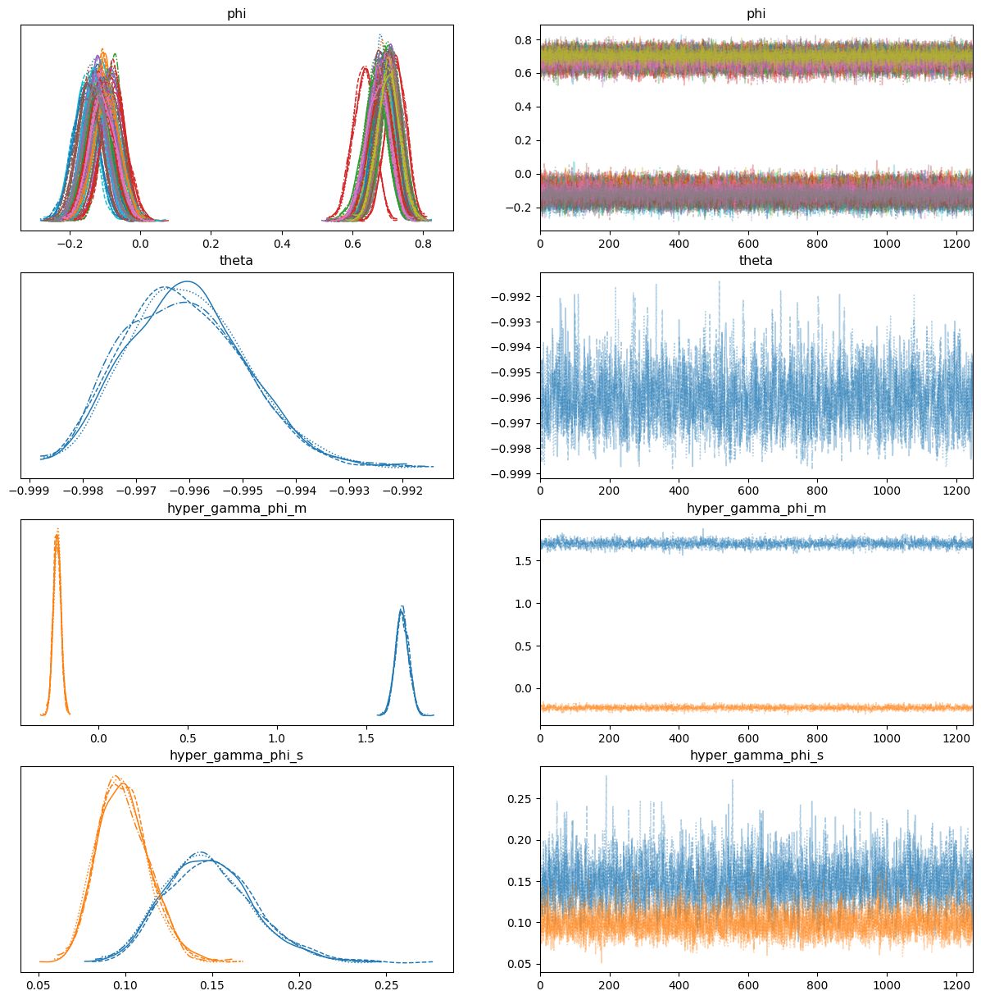

In [8]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['phi','theta','hyper_gamma_phi_m','hyper_gamma_phi_s'], divergences=True, figsize=(15,15))

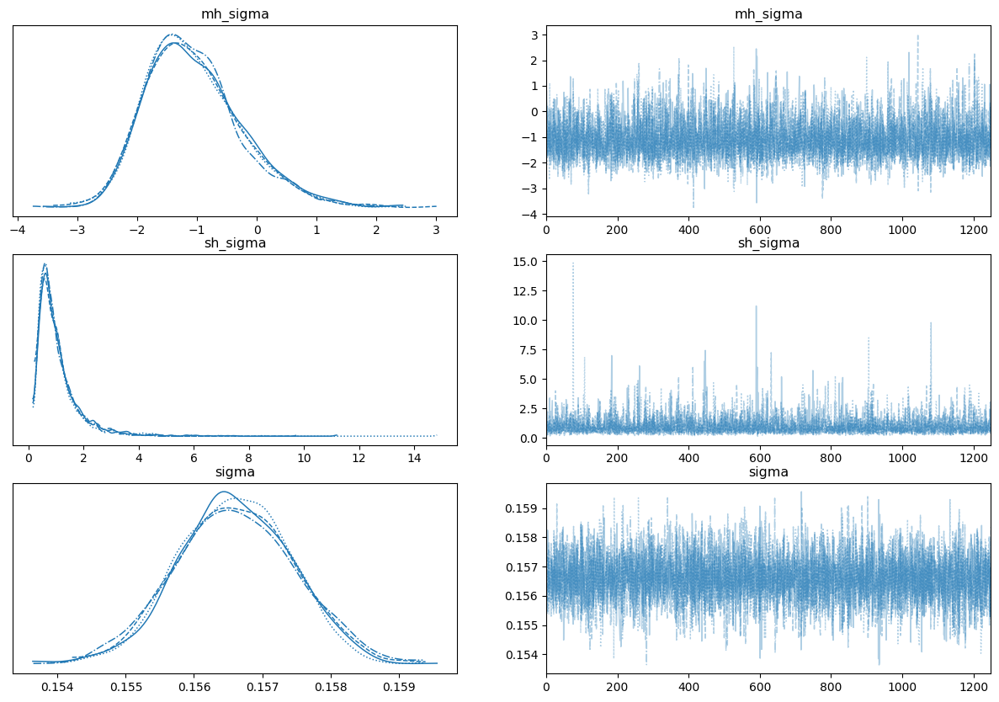

In [9]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['mh_sigma','sh_sigma','sigma'], divergences=True, figsize=(15,10))

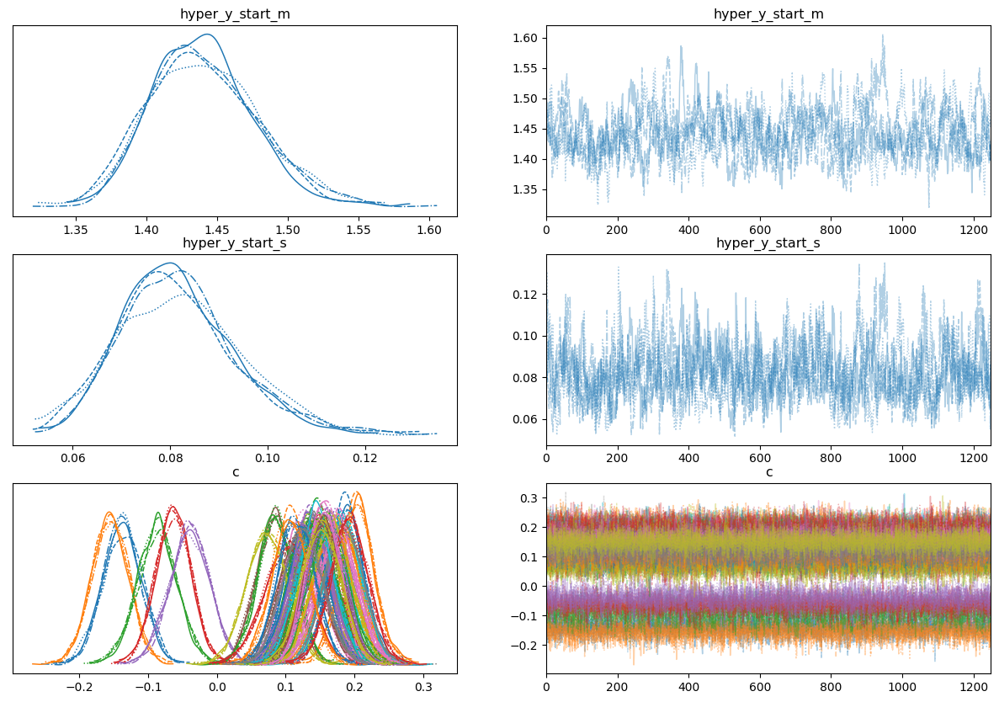

In [10]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['hyper_y_start_m','hyper_y_start_s','c'], divergences=True, figsize=(15,10))

In [11]:
az.summary(ritorno['inference_data'],var_names=['y_start'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"y_start[0, 0]",1.428,0.090,1.261,1.599,0.002,0.002,1424.0,2519.0,1.0
"y_start[0, 1]",1.426,0.086,1.273,1.597,0.003,0.002,1028.0,2065.0,1.0
"y_start[0, 2]",1.428,0.091,1.256,1.601,0.003,0.002,1207.0,1566.0,1.0
"y_start[0, 3]",1.430,0.091,1.255,1.598,0.002,0.002,1439.0,1768.0,1.0
"y_start[0, 4]",1.436,0.094,1.262,1.609,0.003,0.002,1339.0,1878.0,1.0
...,...,...,...,...,...,...,...,...,...
"y_start[2, 44]",1.451,0.054,1.354,1.559,0.002,0.001,981.0,1643.0,1.0
"y_start[2, 45]",1.447,0.056,1.342,1.551,0.002,0.001,888.0,1248.0,1.0
"y_start[2, 46]",1.443,0.054,1.348,1.550,0.002,0.001,918.0,1881.0,1.0
"y_start[2, 47]",1.459,0.056,1.357,1.567,0.002,0.001,826.0,1179.0,1.0


In [12]:
az.summary(ritorno['inference_data'], var_names=['hyper_y_start_m', 'hyper_y_start_s'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
hyper_y_start_m,1.441,0.038,1.374,1.514,0.003,0.002,226.0,404.0,1.01
hyper_y_start_s,0.082,0.013,0.059,0.106,0.001,0.000,359.0,907.0,1.01


<AxesSubplot: ylabel='Density'>

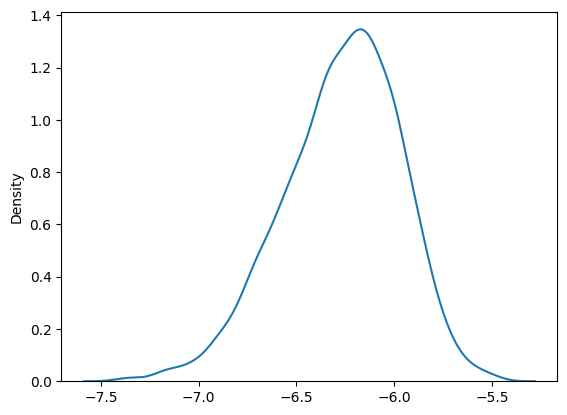

In [13]:
aux_shape = ritorno['inference_data'].posterior.gamma_th.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.gamma_th.values.reshape((aux_shape[0]*aux_shape[1])), legend=False)

<AxesSubplot: ylabel='Density'>

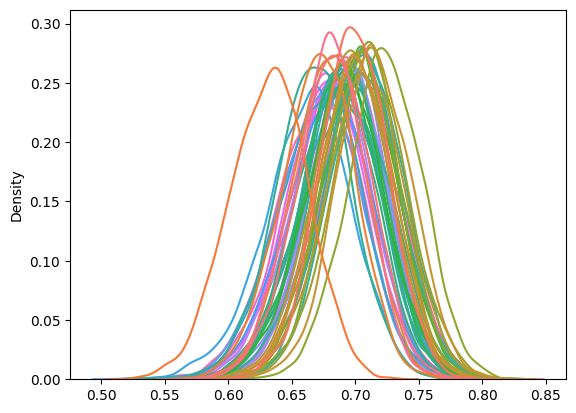

In [14]:
aux_shape = ritorno['inference_data'].posterior.phi.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.phi.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2],aux_shape[3]))[:,0,:], legend=False)

<AxesSubplot: ylabel='Density'>

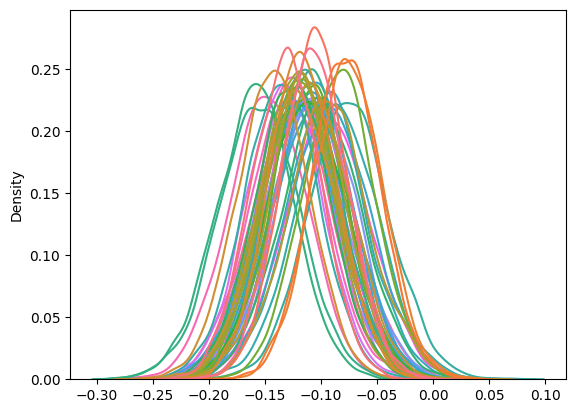

In [15]:
aux_shape = ritorno['inference_data'].posterior.phi.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.phi.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2],aux_shape[3]))[:,1,:], legend=False)

<AxesSubplot: ylabel='Density'>

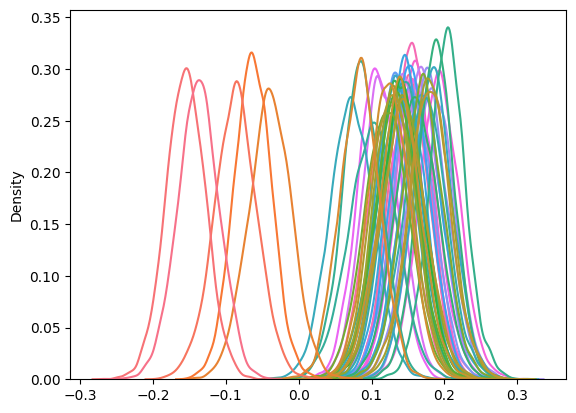

In [16]:
aux_shape = ritorno['inference_data'].posterior.c.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.c.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

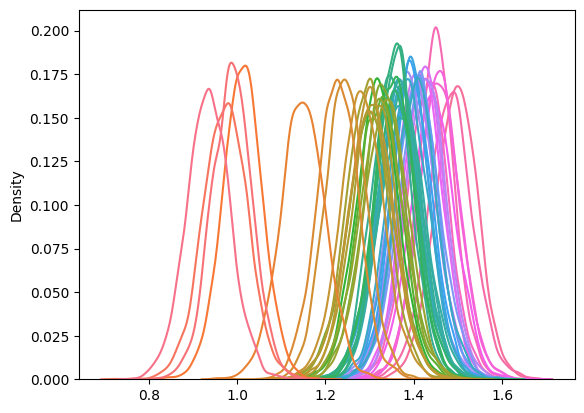

In [17]:
aux_shape = ritorno['inference_data'].posterior.annual_mean.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_mean.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

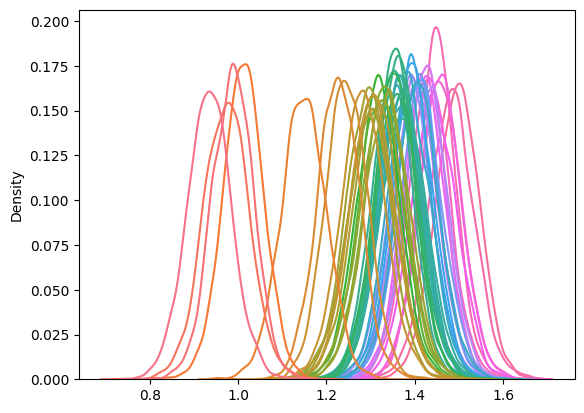

In [18]:
aux_shape = ritorno['inference_data'].posterior.annual_median.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_median.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

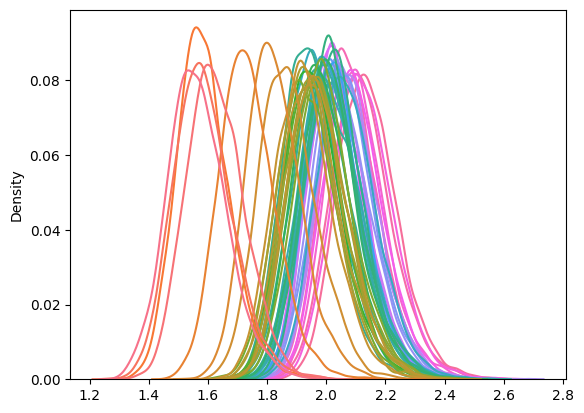

In [19]:
aux_shape = ritorno['inference_data'].posterior.annual_max.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_max.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

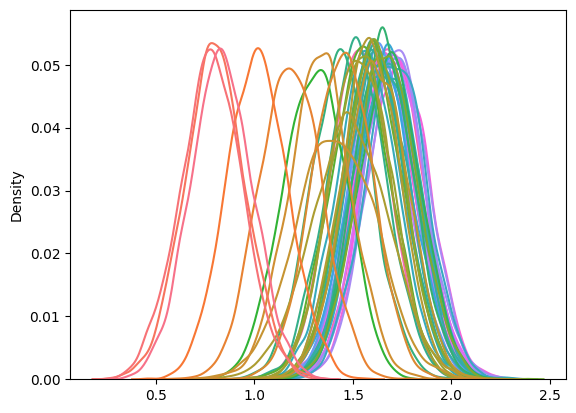

In [20]:
valori_31_dic = []
for dizionario in ritorno['missing']:
    if dizionario['Data'] == '2018-12-31':
        valori_31_dic.append(dizionario['Samples'])
        
res_plot = sns.kdeplot(valori_31_dic, legend=False)

<AxesSubplot: ylabel='Density'>

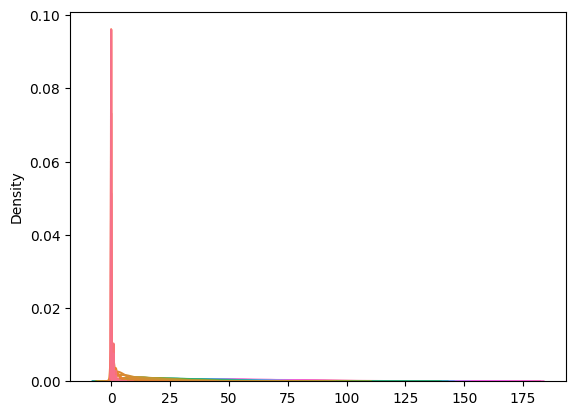

In [21]:
aux_shape = ritorno['inference_data'].posterior.annual_days_over_threshold.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_days_over_threshold.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

In [22]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.annual_days_over_threshold.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,SAVIGNANO DI RIGO,CORTE BRUGNATELLA,FEBBIO,SAN LEO,VERUCCHIO,BADIA,GIARDINI MARGHERITA,SAN PIETRO CAPOFIUME,MARECCHIA,PARCO BERTOZZI,LUGAGNANO,DELTA CERVIA,DE AMICIS,SAN LAZZARO,PARCO RESISTENZA,FRANCHINI-ANGELONI,GHERARDI,VIA CHIARINI,SAVIGNANO,GAVELLO,BESENZONE,VILLA FULVIA,ROMA,PORTA SAN FELICE,CAORLE,CASTELLARANO,PARCO MONTECUCCO,ZALAMELLA,CENTO,PARCO EDILCARANI,BOGOLESE,SARAGAT,PARADIGNA,MALCANTONE,S. LAZZARO,REMESINA,S. ROCCO,CENO,ISONZO,PARCO FERRARI,CITTADELLA,GIORDANI-FARNESE,SAN FRANCESCO,FLAMINIA,MONTEBELLO,GIARDINI,GERBIDO,TIMAVO
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,0.119200,0.130600,0.170800,0.306400,1.583400,4.804800,7.843600,13.554000,15.655600,15.800600,17.107800,17.855200,17.867400,17.951600,18.928600,19.46160,21.112200,21.216200,21.463000,23.671600,23.673800,24.549600,28.082400,28.478600,29.057200,29.496600,29.690800,30.348400,30.654000,30.750400,31.862400,32.414000,34.823600,36.049800,36.40740,36.717600,37.258400,38.640600,41.682000,42.197200,42.662200,46.169400,46.499200,50.950200,51.843400,55.108200,60.897800,63.058000,70.958800
std,0.422643,0.415184,0.533371,0.680156,2.001861,3.975507,5.518299,8.352906,9.705845,9.337059,10.243806,9.912491,9.684223,9.433147,10.543004,10.36772,11.518565,11.860742,11.379584,11.679479,11.559901,13.067857,13.089594,13.462979,13.000359,14.558213,12.144146,14.083433,14.440166,14.005246,12.495227,14.122114,14.769946,15.517109,15.62687,15.295524,15.270752,15.793585,16.954432,16.223247,16.549878,17.223322,17.256279,17.201375,19.372205,19.523666,19.522161,22.329388,22.126125
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,3.000000,3.000000,1.000000,1.000000,3.00000,2.000000,3.000000,3.000000,3.000000,3.000000,5.000000,6.000000,5.000000,8.000000,6.000000,7.000000,11.000000,8.000000,8.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,4.000000,8.000000,9.000000,9.000000,10.000000,11.000000,11.000000,11.000000,11.000000,12.00000,13.000000,13.000000,13.000000,15.000000,15.000000,15.000000,19.000000,19.000000,20.000000,19.000000,21.000000,20.000000,20.000000,21.000000,23.000000,22.000000,24.000000,25.000000,25.00000,26.000000,26.000000,27.000000,30.000000,30.000000,31.000000,34.000000,34.000000,39.000000,38.000000,42.000000,47.000000,47.000000,55.000000
50%,0.000000,0.000000,0.000000,0.000000,1.000000,4.000000,7.000000,12.000000,14.000000,14.000000,15.000000,16.000000,16.000000,16.000000,17.000000,18.00000,19.000000,19.000000,20.000000,22.000000,22.000000,22.000000,26.000000,27.000000,27.000000,27.000000,28.000000,28.000000,29.000000,29.000000,30.000000,30.000000,33.000000,34.000000,34.00000,35.000000,35.000000,37.000000,40.000000,41.000000,41.000000,45.000000,45.000000,49.000000,50.000000,53.000000,59.000000,61.000000,69.000000
75%,0.000000,0.000000,0.000000,0.000000,2.000000,7.000000,11.000000,18.000000,21.000000,20.250000,22.000000,23.000000,23.000000,23.000000,24.000000,25.00000,27.000000,27.000000,27.000000,30.000000,30.000000,31.000000,35.000000,36.000000,37.000000,38.000000,37.000000,38.000000,39.000000,39.000000,39.000000,41.000000,44.000000,45.000000,45.00000,46.000000,46.000000,48.000000,51.250000,52.000000,52.000000,56.000000,57.000000,61.000000,63.000000,67.000000,73.000000,76.0

In [23]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.is_over_daily_limit.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,FEBBIO,CORTE BRUGNATELLA,SAVIGNANO DI RIGO,SAN LEO,VERUCCHIO,BADIA,GIARDINI MARGHERITA,MARECCHIA,SAN PIETRO CAPOFIUME,DE AMICIS,DELTA CERVIA,LUGAGNANO,PARCO BERTOZZI,SAN LAZZARO,PARCO RESISTENZA,VIA CHIARINI,FRANCHINI-ANGELONI,GHERARDI,GAVELLO,SAVIGNANO,BESENZONE,VILLA FULVIA,ROMA,PORTA SAN FELICE,CASTELLARANO,CAORLE,PARCO MONTECUCCO,CENTO,ZALAMELLA,PARCO EDILCARANI,BOGOLESE,SARAGAT,PARADIGNA,MALCANTONE,S. LAZZARO,REMESINA,S. ROCCO,CENO,ISONZO,PARCO FERRARI,CITTADELLA,GIORDANI-FARNESE,FLAMINIA,SAN FRANCESCO,MONTEBELLO,GERBIDO,GIARDINI,TIMAVO
count,5000.0,5000.0,5000.0,5000.0,5000.0,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000
mean,0.0,0.0,0.0,0.0,0.0,0.000400,0.00100,0.022600,0.038200,0.043400,0.051800,0.052600,0.056000,0.057200,0.074000,0.078400,0.111200,0.113000,0.114800,0.140000,0.142600,0.173200,0.248800,0.260400,0.276000,0.276800,0.28500,0.299800,0.317400,0.320800,0.340400,0.363400,0.42940,0.463600,0.46640,0.485800,0.496000,0.531800,0.604000,0.624000,0.635000,0.709200,0.725200,0.796000,0.821600,0.853600,0.910800,0.92000,0.960600
std,0.0,0.0,0.0,0.0,0.0,0.019998,0.03161,0.148639,0.191698,0.203776,0.221645,0.223256,0.229945,0.232248,0.261797,0.268827,0.314411,0.316624,0.318812,0.347022,0.349699,0.378458,0.432361,0.438897,0.447061,0.447462,0.45146,0.458216,0.465511,0.466831,0.473891,0.481027,0.49504,0.498723,0.49892,0.499848,0.500034,0.499038,0.489113,0.484428,0.481478,0.454177,0.446458,0.403009,0.382887,0.353542,0.285061,0.27132,0.194564
min,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
25%,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000
50%,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000
75%,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000
max,0.0,0.0,0.0,0.0,0.0,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0

<AxesSubplot: >

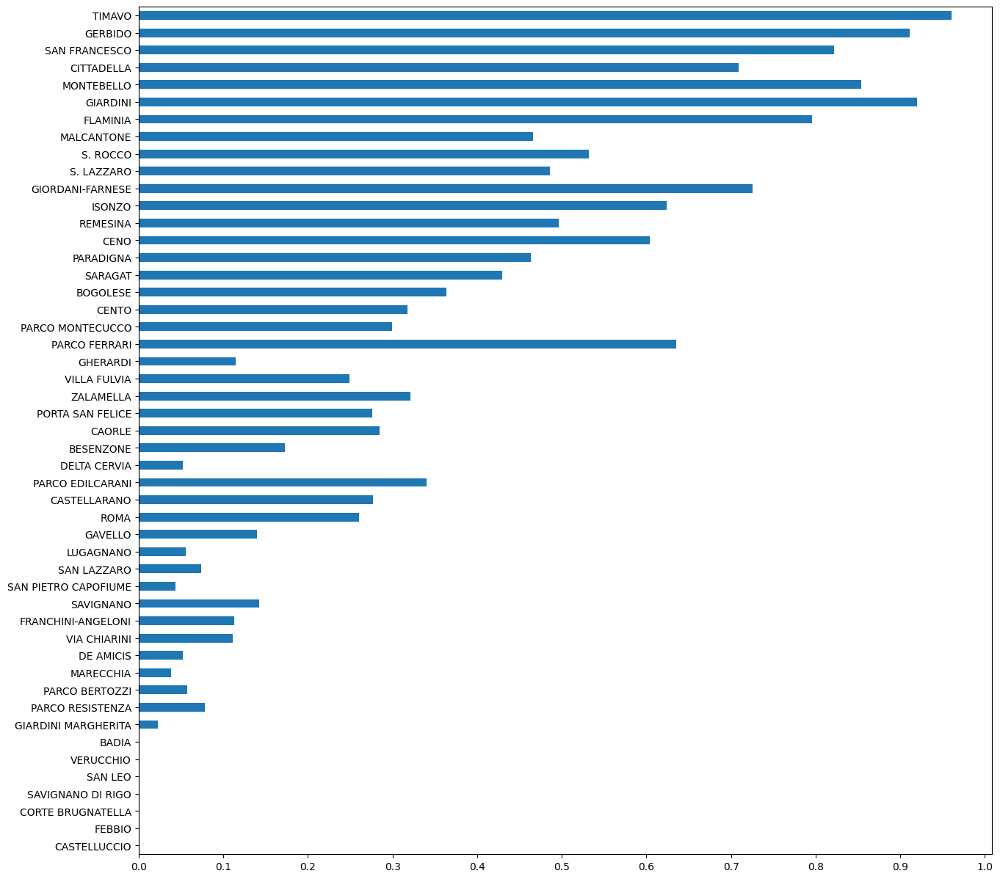

In [24]:
aux_results.loc['mean',:].plot(kind='barh', figsize=(15,15), xticks=np.linspace(0,1,11))
#res = plt.xticks(rotation = 30)

In [25]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.is_over_annual_limit.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,BOGOLESE,CENTO,PARCO MONTECUCCO,PARCO FERRARI,VILLA FULVIA,ZALAMELLA,PORTA SAN FELICE,S. LAZZARO,BESENZONE,DELTA CERVIA,PARCO EDILCARANI,CASTELLARANO,GAVELLO,SARAGAT,SAN LAZZARO,LUGAGNANO,SAVIGNANO,FEBBIO,CORTE BRUGNATELLA,SAVIGNANO DI RIGO,SAN LEO,VERUCCHIO,BADIA,SAN PIETRO CAPOFIUME,GIARDINI MARGHERITA,PARCO BERTOZZI,MARECCHIA,DE AMICIS,VIA CHIARINI,FRANCHINI-ANGELONI,PARCO RESISTENZA,REMESINA,ISONZO,S. ROCCO,CAORLE,PARADIGNA,GHERARDI,ROMA,CENO,GIORDANI-FARNESE,MALCANTONE,CITTADELLA,SAN FRANCESCO,GIARDINI,FLAMINIA,MONTEBELLO,GERBIDO,TIMAVO
count,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.00000,5000.00000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000200,0.000200,0.000200,0.000200,0.000200,0.000200,0.000400,0.00060,0.00060,0.00060,0.00100,0.001800,0.002200,0.002600,0.013400,0.014600
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.014142,0.014142,0.014142,0.014142,0.014142,0.014142,0.019998,0.02449,0.02449,0.02449,0.03161,0.042392,0.046857,0.050929,0.114992,0.119957
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.00000,1.00000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000


<AxesSubplot: >

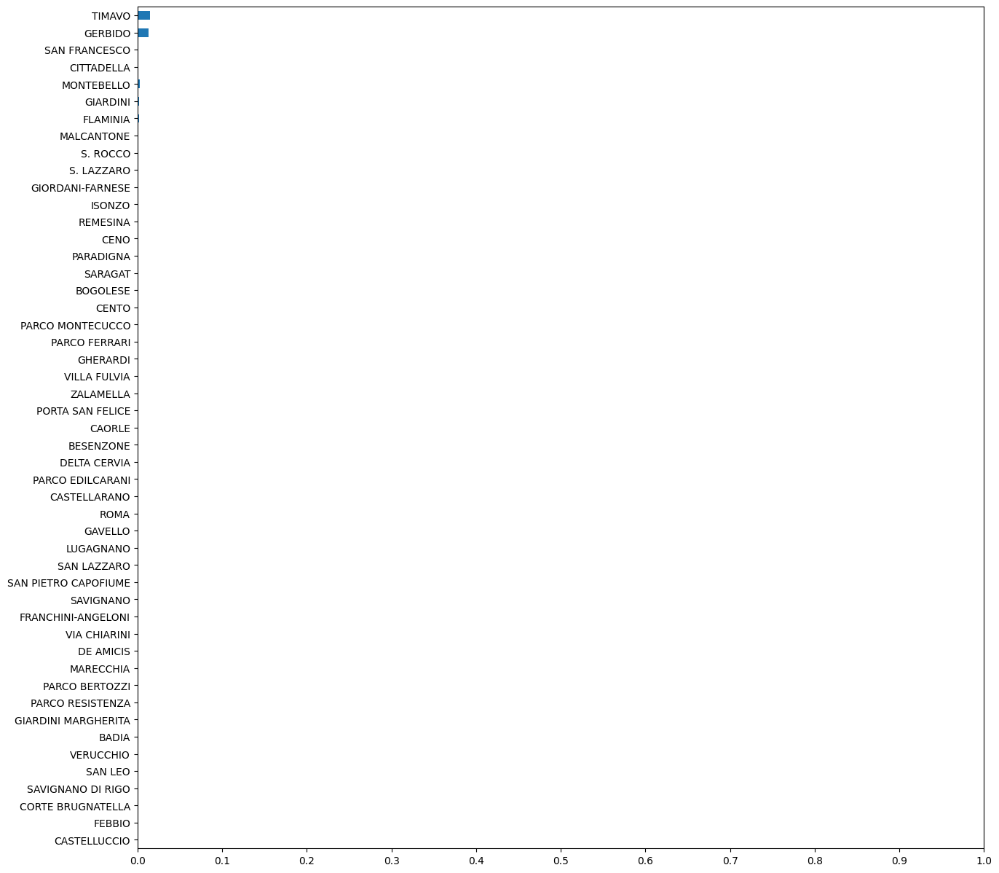

In [26]:
aux_results.loc['mean',:].plot(kind='barh', figsize=(15,15), xticks=np.linspace(0,1,11))
#res = plt.xticks(rotation = 30)

In [27]:
y_post_pred = ritorno['inference_data'].posterior.y_post_pred.to_numpy()
y_post_pred = y_post_pred.reshape(y_post_pred.shape[0]*y_post_pred.shape[1], y_post_pred.shape[2], y_post_pred.shape[3])
y_post_pred.shape

(5000, 365, 49)

In [28]:
import ipywidgets as widgets
from ipywidgets import HBox, VBox
from IPython.display import display

In [29]:
@widgets.interact(stazione = df.columns)
def f(stazione):
    col_map = sns.light_palette((20, 75, 70), input='husl', as_cmap=True)

    plt.figure(figsize=(14,8))
    ax = plt.subplot(1,1,1)

    idx_stazione = df.columns.to_list().index(stazione)
    
    """
    sns.lineplot(np.transpose(y_post_pred[0:50,:,idx_stazione]))
    """

    lower_lim = np.zeros(len(df.index))
    upper_lim = np.zeros(len(df.index))    
    for i in range(len(df.index)):
        lower_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],2.5)
        upper_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],97.5)
    
    
#    sns.lineplot(lower_lim)
#    sns.lineplot(upper_lim)
    
    for i in range(len(df.index)):
        ax.add_patch(mplt.patches.Rectangle((i,lower_lim[i]),1,upper_lim[i]-lower_lim[i], fill=True, color=col_map(180)))

    sns.lineplot(df[stazione])    
    sns.lineplot(np.mean(y_post_pred[:,:,idx_stazione], axis=0))


    index = 0
    for line in ax.get_lines():
        if index == 0:
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(155))
        else:
            col_map = sns.dark_palette((10,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
        index += 1
        
    plt.ylim(bottom=0,top=2.5)

    primo_giorno = datetime.date(2018,1,1)
    date_da_segnare = []
    date_da_segnare_posizioni = []

    for i in range(12):
        date_da_segnare.append(datetime.date(2018,i+1,1))
        date_da_segnare_posizioni.append((date_da_segnare[2*i] - primo_giorno).days)
        date_da_segnare.append(datetime.date(2018,i+1,15))
        date_da_segnare_posizioni.append((date_da_segnare[2*i+1] - primo_giorno).days)
        date_da_segnare[2*i] = date_da_segnare[2*i].isoformat()
        date_da_segnare[2*i+1] = date_da_segnare[2*i+1].isoformat()

    plt.xticks(date_da_segnare_posizioni,date_da_segnare,rotation=65)
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=True,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=True)
    plt.grid()
    
    """
    ax.get_legend().remove()
    col_vals = np.linspace(1,255,num=len(df.columns))
    index = 0
    for line in ax.get_lines():
        if(index == len(ax.get_lines()) - 1):
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            continue
        if(index == len(ax.get_lines()) - 2):
            col_map = sns.dark_palette((120,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            index += 1
            continue

        #line.set_c(col_map(int(np.round(col_vals[index]))))
        line.set_c(col_map(220))
        line.set_alpha(0.3)
        index += 1
    """
    
    

    plt.show()

interactive(children=(Dropdown(description='stazione', options=('CASTELLUCCIO', 'FEBBIO', 'CORTE BRUGNATELLA',…

In [30]:
def f(stazione):
    col_map = sns.light_palette((20, 75, 70), input='husl', as_cmap=True)

    plt.figure(figsize=(14,8))
    ax = plt.subplot(1,1,1)

    idx_stazione = df.columns.to_list().index(stazione)
    
    """
    sns.lineplot(np.transpose(y_post_pred[0:50,:,idx_stazione]))
    """

    lower_lim = np.zeros(len(df.index))
    upper_lim = np.zeros(len(df.index))    
    for i in range(len(df.index)):
        lower_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],2.5)
        upper_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],97.5)
    
    
#    sns.lineplot(lower_lim)
#    sns.lineplot(upper_lim)
    
    for i in range(len(df.index)):
        ax.add_patch(mplt.patches.Rectangle((i,lower_lim[i]),1,upper_lim[i]-lower_lim[i], fill=True, color=col_map(180)))

    sns.lineplot(df[stazione])    
    sns.lineplot(np.mean(y_post_pred[:,:,idx_stazione], axis=0))


    index = 0
    for line in ax.get_lines():
        if index == 0:
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(155))
        else:
            col_map = sns.dark_palette((10,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
        index += 1
        
    plt.ylim(bottom=0,top=2.5)

    primo_giorno = datetime.date(2018,1,1)
    date_da_segnare = []
    date_da_segnare_posizioni = []

    for i in range(12):
        date_da_segnare.append(datetime.date(2018,i+1,1))
        date_da_segnare_posizioni.append((date_da_segnare[2*i] - primo_giorno).days)
        date_da_segnare.append(datetime.date(2018,i+1,15))
        date_da_segnare_posizioni.append((date_da_segnare[2*i+1] - primo_giorno).days)
        date_da_segnare[2*i] = date_da_segnare[2*i].isoformat()
        date_da_segnare[2*i+1] = date_da_segnare[2*i+1].isoformat()

    plt.xticks(date_da_segnare_posizioni,date_da_segnare,rotation=65)
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=True,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=True)
    plt.grid()
    
    """
    ax.get_legend().remove()
    col_vals = np.linspace(1,255,num=len(df.columns))
    index = 0
    for line in ax.get_lines():
        if(index == len(ax.get_lines()) - 1):
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            continue
        if(index == len(ax.get_lines()) - 2):
            col_map = sns.dark_palette((120,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            index += 1
            continue

        #line.set_c(col_map(int(np.round(col_vals[index]))))
        line.set_c(col_map(220))
        line.set_alpha(0.3)
        index += 1
    """
    
    

    plt.show()

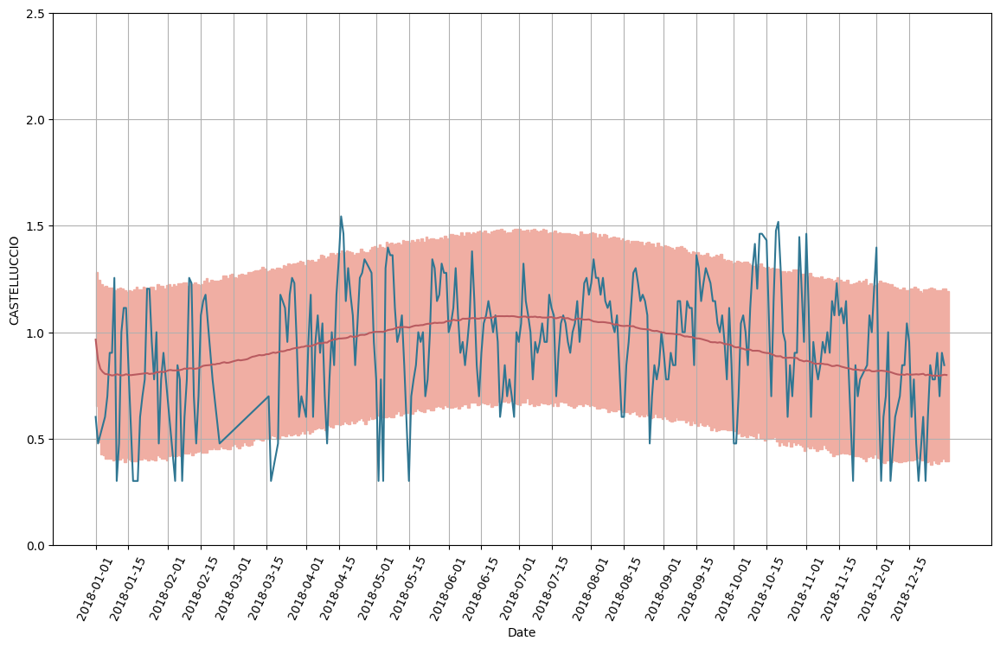

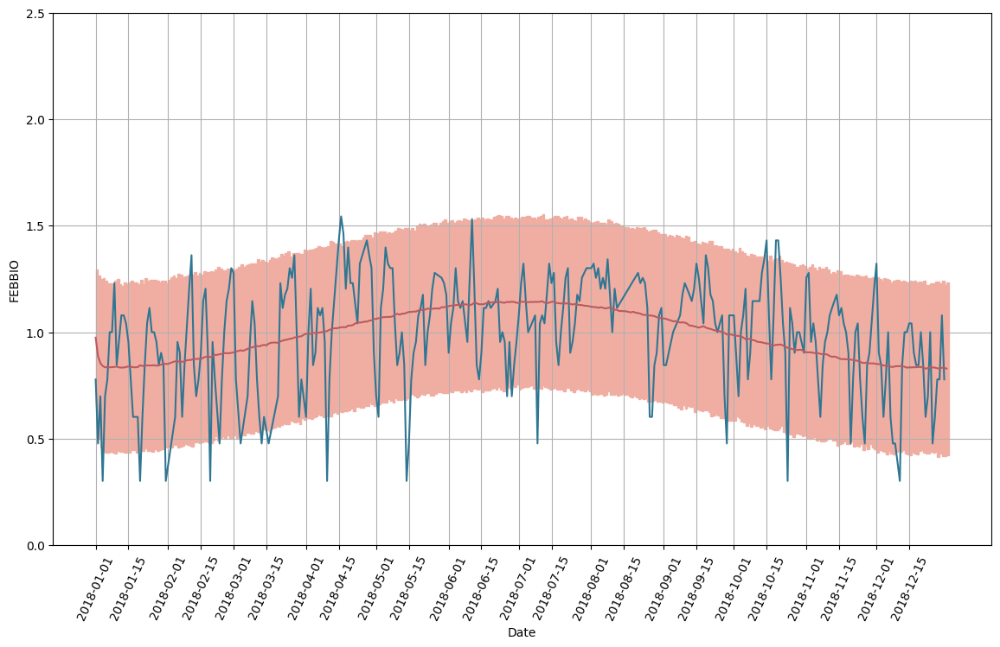

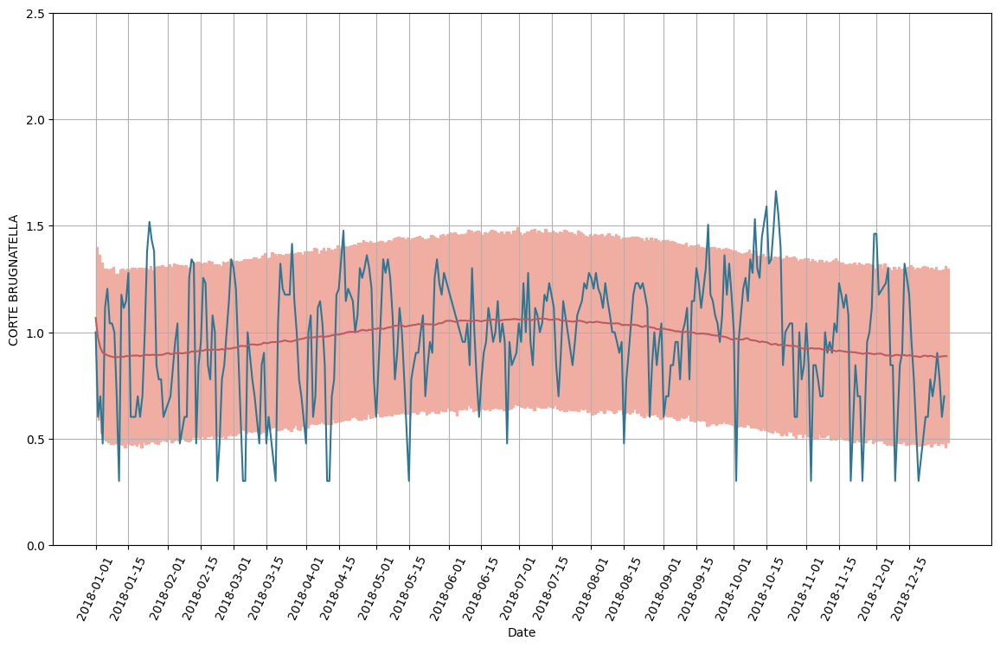

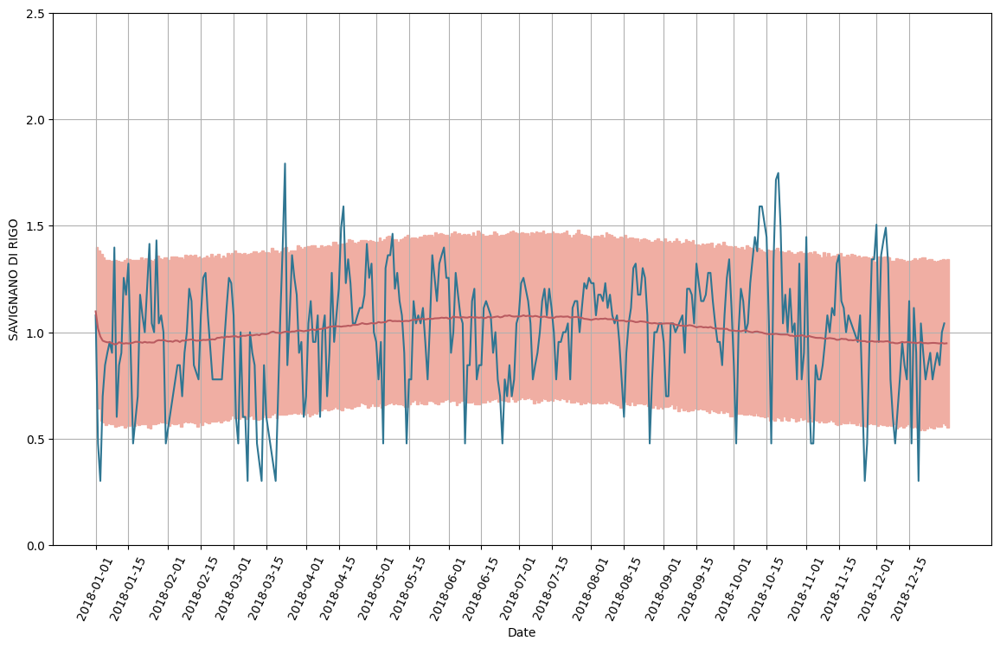

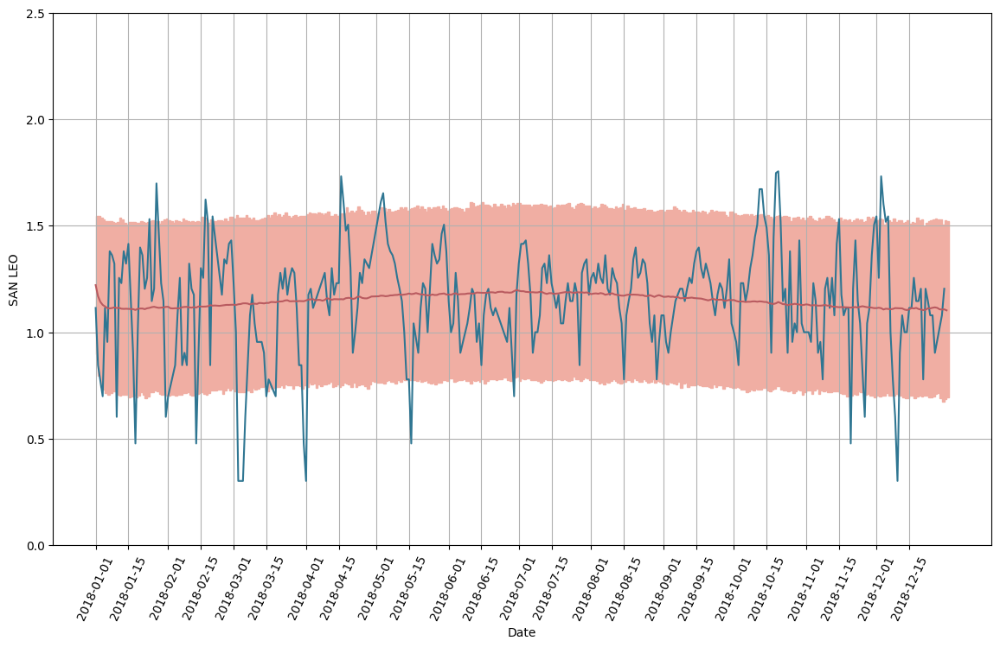

...

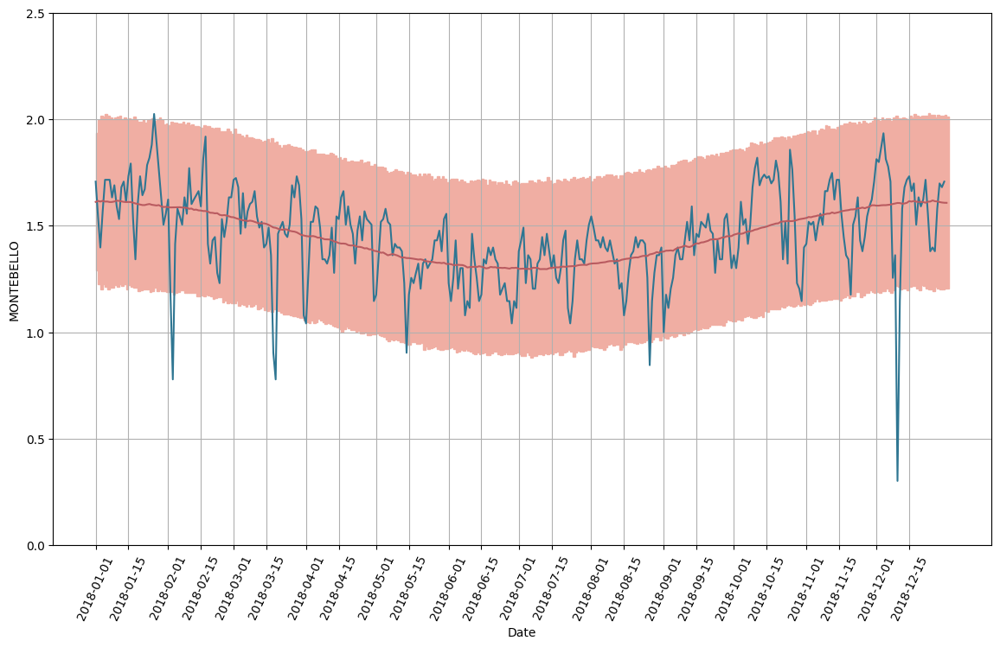

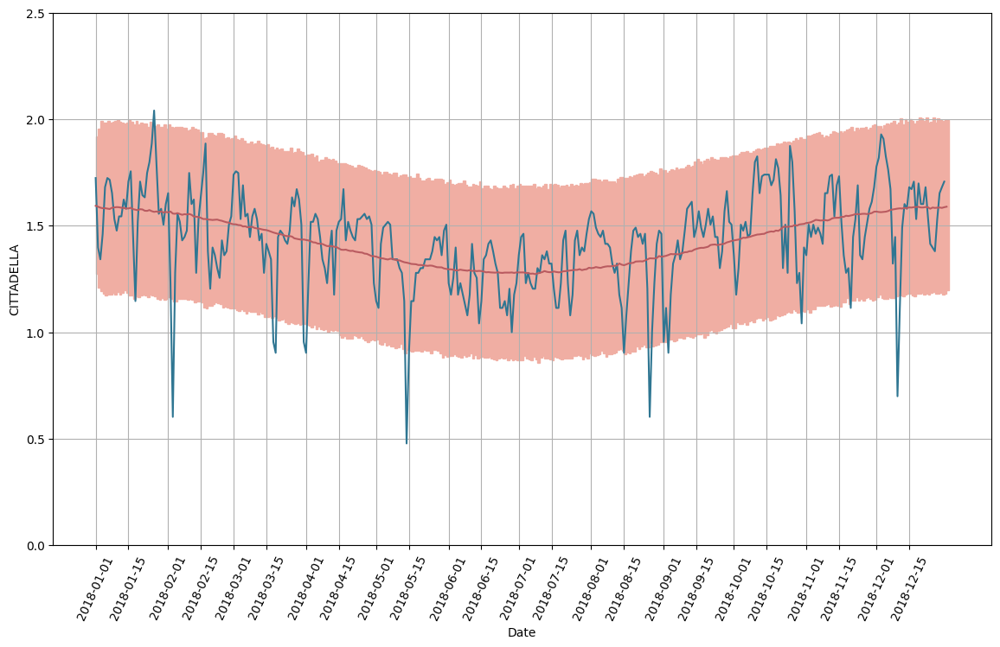

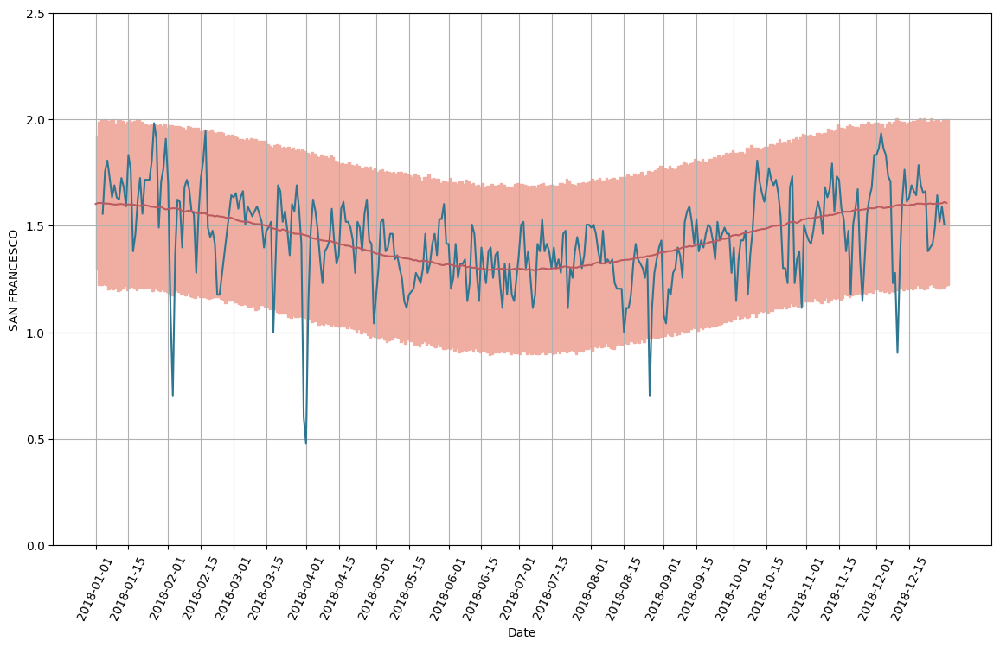

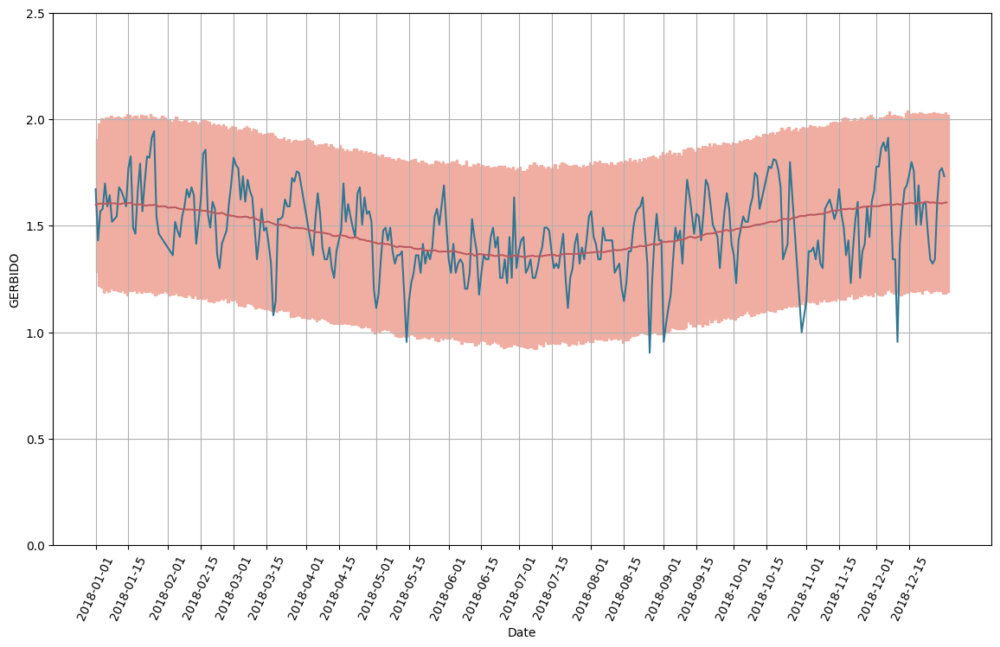

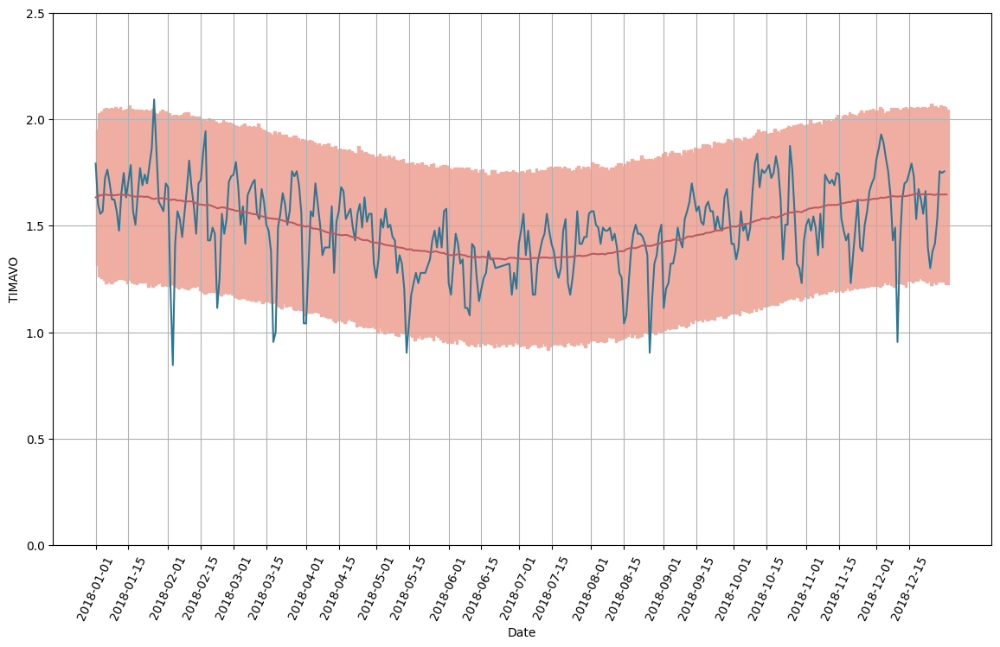

In [31]:
for stazione in df.columns:
    f(stazione)